# Atividade Integradora

# Road Map

## Recomendação: business bem avaliado que o usuário não foi

### Business: 
       - explodir atributos e horas de funcionamento
       - tratar atributos - selecionar os que fazem sentido e transforar true ou false para dummy
       - rodar um [k-means](https://spark.apache.org/docs/latest/api/python/pyspark.ml.html?highlight=kmeans#pyspark.ml.clustering.KMeans) na base
       - criar uma lista de business_id e no do cluster (cluster_bz)
       (- join horários mais frequentados pela base de check-in)
       - ordenar business por nota


### Users
       - Clusterização de usuários para traçar perfil comum
       - identificar usuários mais engajados/populares/com reviews mais bem avaliadas
       - entender 'elite'
       - verificar rede de amigos - matriz de distância pela lista de amigos
       
### Reviews:
        - Join lista de cluster de usuários (perfil_usr)
        - Juntar atributos das tips na base: contagem, compliments, se teve ou não tips
        - Text mining nas reviews/tip para encontrar as palavras com maior frequência em cada cluster_bz  e cluster_usr
        - Lista com palavras mais frequentes e nota média por cluster_bz
        (- Comparar horário dos reveiws com quantidade de check-ins no estabelecimento)
        - avaliar evolução das notas por perfil de usuário
        - Wordclouds

### Base para modelagem

## Algoritmo para Recomendação (rascunho)
usuário ---> classificado no cluster
- buscar clusters de business mais bem avaliados pelo cluster do usuário
- selecionar cluster mais bem avaliado
- filtrar estabelecimentos que o usuário ainda não foi (não tem review)
- selecionar os 5 mais bem avaliados para a recomendação

### Check-Ins
### Tips

* modelo:
    - input dos dados do perfil usuário + reviews realizadas + restaurantes frequentados
    - output: número do cluster de restaurantes filtrado com os não frequentados


# Ambiente Spark

In [1]:
import findspark as fs
from pyspark.sql import SparkSession

In [2]:
from pyspark.sql import SparkSession
from pyspark.sql.types import *
from pyspark.sql import functions as f
from pyspark.sql.window import Window
from pyspark.ml.feature import StopWordsRemover
import pandas as pd
import seaborn as sns
sns.set(style="ticks", palette="pastel")
import os
from wordcloud import WordCloud, ImageColorGenerator
import matplotlib.pyplot as plt
%matplotlib inline

In [3]:
#MAC Local (Viviane)
spark_location='/Users/vivi/server/spark' # Set your own
java8_location= '/Library/Java/JavaVirtualMachines/jdk1.8.0_251.jdk/Contents/Home/' # Set your own
os.environ['JAVA_HOME'] = java8_location
fs.init(spark_home=spark_location)

In [4]:
#datapath = 'C:\\Users\\RuWindows\\Desktop\\PI\\yelp_dataset\\' #Marcelo
#datapath = '../data/yelp' #servidor AWS
datapath = 'data' #Viviane

In [5]:
#files = sorted(os.listdir(datapath))
#files

In [6]:
#!head data/yelp_academic_dataset_review.json

In [7]:
# Spark Session
#spark = SparkSession.builder \
#    .master('local[*]') \
#    .appName('Integradora Yelp') \
#    .config("spark.ui.port", "4060") \
#    .getOrCreate()

In [8]:
spark = SparkSession.builder \
            .master('local[8]') \
            .appName('Yelp Integradora') \
            .getOrCreate()

In [9]:
sc = spark.sparkContext

In [10]:
spark#.stop()

## Importando as Bases Origem - Raw

In [11]:
usr_raw = spark.read.json(datapath+'/yelp_academic_dataset_user.json')
rv_raw = spark.read.json(datapath+'/yelp_academic_dataset_review.json')
bz_raw = spark.read.json(datapath+'/yelp_academic_dataset_business.json')
tp_raw = spark.read.json(datapath+'/yelp_academic_dataset_tip.json')
ch_raw = spark.read.json(datapath+'/yelp_academic_dataset_checkin.json')

In [12]:
# Visualizando Estrutura
#bz_raw.printSchema()

# Tratamento das bases

## Check-ins

- Explosão das datas na base

In [13]:
ch = ch_raw.withColumn('dt', f.explode(f.split(f.col('date'),', ')))

In [14]:
ch_raw.show()

+--------------------+--------------------+
|         business_id|                date|
+--------------------+--------------------+
|--1UhMGODdWsrMast...|2016-04-26 19:49:...|
|--6MefnULPED_I942...|2011-06-04 18:22:...|
|--7zmmkVg-IMGaXbu...|2014-12-29 19:25:...|
|--8LPVSo5i0Oo61X0...| 2016-07-08 16:43:30|
|--9QQLMTbFzLJ_oT-...|2010-06-26 17:39:...|
|--9e1ONYQuAa-CB_R...|2010-02-08 05:56:...|
|--DaPTJW3-tB1vP-P...|2012-06-03 17:46:...|
|--DdmeR16TRb3LsjG...|2012-11-02 21:26:...|
|--EF5N7P70J_UYBTP...|2018-05-25 19:52:...|
|--EX4rRznJrltyn-3...|2010-02-26 17:05:...|
|--FBCX-N37CMYDfs7...|2010-05-31 07:57:...|
|--FLdgM0GNpXVMn74...|2012-10-23 18:47:...|
|--FnvijzY20d1nk9H...|2019-09-19 02:42:...|
|--GM_ORV2cYS-h38D...|2011-09-11 18:16:...|
|--I7YYLada0tSLkOR...|2014-11-07 00:51:...|
|--KCl2FvVQpvjzmZS...|2011-07-29 16:53:...|
|--KQsXc-clkO7oHRq...|2010-05-02 23:57:...|
|--Ni3oJ4VOqfOEu7S...| 2019-06-07 17:54:58|
|--Rsj71PBe31h5Ylj...|2011-12-15 18:09:...|
|--S62v0QgkqQaVUhF...|2010-12-25

In [15]:
ch.createOrReplaceTempView('ch')

In [16]:
ch1 = spark.sql('''
            SELECT business_id, dt,
            DATE(dt) AS date,
            DAYOFWEEK(dt) AS dow,
            MONTH(dt) AS month,
            YEAR(dt) AS year,
            HOUR(dt) AS hour,
            DAY(dt) AS day
            
            FROM ch
            
            ''')

In [17]:
ch1.show()

+--------------------+-------------------+----------+---+-----+----+----+---+
|         business_id|                 dt|      date|dow|month|year|hour|day|
+--------------------+-------------------+----------+---+-----+----+----+---+
|--1UhMGODdWsrMast...|2016-04-26 19:49:16|2016-04-26|  3|    4|2016|  19| 26|
|--1UhMGODdWsrMast...|2016-08-30 18:36:57|2016-08-30|  3|    8|2016|  18| 30|
|--1UhMGODdWsrMast...|2016-10-15 02:45:18|2016-10-15|  7|   10|2016|   2| 15|
|--1UhMGODdWsrMast...|2016-11-18 01:54:50|2016-11-18|  6|   11|2016|   1| 18|
|--1UhMGODdWsrMast...|2017-04-20 18:39:06|2017-04-20|  5|    4|2017|  18| 20|
|--1UhMGODdWsrMast...|2017-05-03 17:58:02|2017-05-03|  4|    5|2017|  17|  3|
|--1UhMGODdWsrMast...|2019-03-19 22:04:48|2019-03-19|  3|    3|2019|  22| 19|
|--6MefnULPED_I942...|2011-06-04 18:22:23|2011-06-04|  7|    6|2011|  18|  4|
|--6MefnULPED_I942...|2011-07-23 23:51:33|2011-07-23|  7|    7|2011|  23| 23|
|--6MefnULPED_I942...|2012-04-15 01:07:50|2012-04-15|  1|    4|2

In [18]:
ch1.createOrReplaceTempView('ch1')

In [19]:
ch2 = spark.sql('''
            SELECT  business_id, year, month, dow, day,
                    COUNT(date) AS count
            
            FROM ch1
            
            GROUP BY business_id, year, month, dow, day
            ORDER BY count DESC
                 
            ''')

In [20]:
ch2.createOrReplaceTempView('ch2')

### Analisando o movimento de um estabelecimento

In [21]:
df = spark.sql('''
            SELECT *
            FROM ch2

            WHERE business_id = 'BxCzy1WOVxOrr_G7V4BIvg'
            
            ''').toPandas()

In [22]:
df2 = df.groupby(['month','dow'])['count'].sum().unstack('dow').fillna(0)   

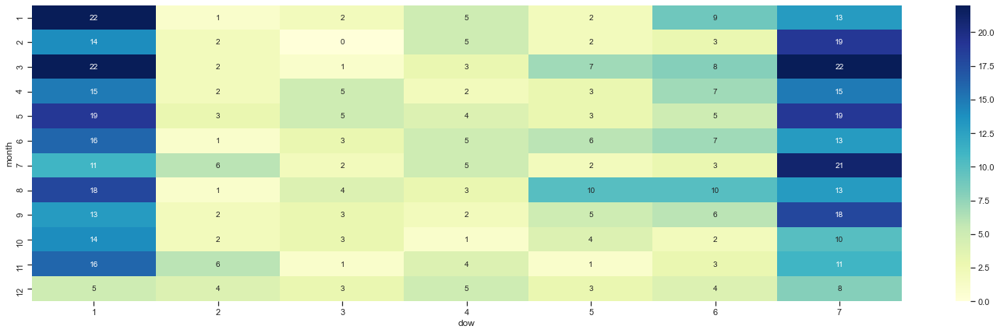

In [23]:
plt.figure(figsize = (25,7))
sns.heatmap(data = df2, cmap="YlGnBu", annot = True)

Pelo gráfico, verfica-se que o local é ais movimentado em janeiro, principalmente aos finais de semana. Para a modelagem, o ideal seria utilizar a moda (valor mais frequente) dos check-ins. A média pode não ser representativa, pois o pico de movimento está concentrado aos finais de semana. 

## Tips

In [24]:
tp_raw.createOrReplaceTempView('tp')

In [25]:
tp_raw.show()

+--------------------+----------------+-------------------+--------------------+--------------------+
|         business_id|compliment_count|               date|                text|             user_id|
+--------------------+----------------+-------------------+--------------------+--------------------+
|UYX5zL_Xj9WEc_Wp-...|               0|2013-11-26 18:20:08|Here for a quick mtg|hf27xTME3EiCp6NL6...|
|Ch3HkwQYv1YKw_FO0...|               0|2014-06-15 22:26:45|Cucumber strawber...|uEvusDwoSymbJJ0au...|
|rDoT-MgxGRiYqCmi0...|               0|2016-07-18 22:03:42|Very nice good se...|AY-laIws3S7YXNl_f...|
|OHXnDV01gLokiX1EL...|               0|2014-06-06 01:10:34|It's a small plac...|Ue_7yUlkEbX4AhnYd...|
|GMrwDXRlAZU2zj5nH...|               0|2011-04-08 18:12:01|8 sandwiches, $24...|LltbT_fUMqZ-ZJP-v...|
|ALwAlxItASeEs2vYA...|               0|2015-05-20 20:17:38|Great ramen! Not ...|HHNBqfbDR8b1iq-QG...|
|d_L-rfS1vT3JMzgCU...|               0|2014-09-01 01:23:48|Cochinita Pibil w...|r0

- Quantidade de tips por estabelecimento e usuário

In [26]:
tp_usr = spark.sql('''
            SELECT user_id, 
            count(text) AS tips_counter,
            sum(compliment_count) as total_compliments
            
            FROM tp
            
            GROUP BY user_id
            ORDER BY total_compliments DESC
            ''')

In [27]:
tp_usr.show()

+--------------------+------------+-----------------+
|             user_id|tips_counter|total_compliments|
+--------------------+------------+-----------------+
|mkbx55W8B8aPLgDqe...|        2664|             1358|
|zFYs8gSUYDvXkb6O7...|         453|              196|
|0tvCcnfJnSs55iB6m...|        1602|              165|
|R5WcogaoAwjdHxrB2...|         497|              162|
|A0j21z2Q1HGic7jW6...|        1005|              159|
|eZfHm0qI8A_HfvXSc...|        1376|              126|
|2EuPAGalYnP7eSxPg...|        1186|              122|
|CxDOIDnH8gp9KXzpB...|        1673|              115|
|fZY97UjlP-iv35beO...|         330|              107|
|0FMte0z-repSVWSJ_...|         950|              101|
|Fv0e9RIV9jw5TX3ct...|         249|              101|
|3nDUQBjKyVor5wV0r...|        1018|               94|
|u_wqt9RshdZsoj8ik...|         385|               86|
|8DEyKVyplnOcSKx39...|         102|               85|
|uG35h72BAMutvXAWd...|         848|               80|
|dt9IHwfuZs9D9LOH7...|      

In [28]:
tp_usr.createOrReplaceTempView('tp_usr')

In [29]:
tp_bz = spark.sql('''
            SELECT business_id, 
            count(text) AS tips_counter,
            sum(compliment_count) as total_compliments
            
            FROM tp
            
            GROUP BY business_id
            ORDER BY total_compliments DESC
            ''')

In [30]:
tp_bz.createOrReplaceTempView('tp_bz')

In [31]:
tp_bz.show()

+--------------------+------------+-----------------+
|         business_id|tips_counter|total_compliments|
+--------------------+------------+-----------------+
|BQqwIYQuo2W94smjr...|         128|               68|
|FaHADZARwnY4yvlvp...|        3679|               55|
|RESDUcs7fIiihp38-...|        1386|               54|
|55E0-qUHa7Kzqz8rO...|         329|               40|
|DN0b4Un8--Uf6SEWL...|         328|               36|
|QhXBIQWUmQxuVErdw...|          76|               36|
|MpmFFw0GE_2iRFPds...|         696|               35|
|JmI9nslLD7KZqRr__...|        2494|               35|
|DfgZlNgKwBvCpA_0a...|         442|               31|
|QsKhwKYB3YeWXqpIP...|          78|               31|
|OMRYQihVjqqzjoNoQ...|         101|               30|
|awI4hHMfa7H0Xf0-C...|         745|               28|
|X8c23dur0ll2D9XTu...|         298|               26|
|O7UMzd3i-Zk8dMeyY...|         240|               26|
|t-o_Sraneime4DDhW...|         648|               24|
|iCQpiavjjPzJ5_3gP...|      

A quantidade total e o alcance das dicas por estabelecimento serão utilizadas na modelagem.

## Business

### Abertura dos atributos e horários para colunas

In [32]:
dfs = []

for x in ["hours", "attributes"]:
    cols = bz_raw.select(f"{x}.*").columns
    for col in cols:
        try:
            dfs.append(dfs[-1].withColumn(col, f.col(f"{x}.{col}")))
        except IndexError:
            dfs.append(bz_raw.withColumn(col, f.col(f"{x}.{col}")))
            
bz = dfs[-1].drop("hours", "attributes")  
bz.createOrReplaceTempView("bz")
bz.printSchema()

root
 |-- address: string (nullable = true)
 |-- business_id: string (nullable = true)
 |-- categories: string (nullable = true)
 |-- city: string (nullable = true)
 |-- is_open: long (nullable = true)
 |-- latitude: double (nullable = true)
 |-- longitude: double (nullable = true)
 |-- name: string (nullable = true)
 |-- postal_code: string (nullable = true)
 |-- review_count: long (nullable = true)
 |-- stars: double (nullable = true)
 |-- state: string (nullable = true)
 |-- Friday: string (nullable = true)
 |-- Monday: string (nullable = true)
 |-- Saturday: string (nullable = true)
 |-- Sunday: string (nullable = true)
 |-- Thursday: string (nullable = true)
 |-- Tuesday: string (nullable = true)
 |-- Wednesday: string (nullable = true)
 |-- AcceptsInsurance: string (nullable = true)
 |-- AgesAllowed: string (nullable = true)
 |-- Alcohol: string (nullable = true)
 |-- Ambience: string (nullable = true)
 |-- BYOB: string (nullable = true)
 |-- BYOBCorkage: string (nullable = true)

### Limpeza e padronização dos atributos

In [33]:
bz1 = spark.sql('''
                SELECT *
                FROM bz
                WHERE city == 'Toronto' 
                AND is_open == 1
                ''')

In [34]:
bz1.groupBy('is_open').count().show()

+-------+-----+
|is_open|count|
+-------+-----+
|      1|14962|
+-------+-----+



In [35]:
cols = bz_raw.select('attributes.*').columns

- Valores únicos em cada coluna de atributos. As colunas que contém listas serão desconsideradas da base para facilitar a análise. As demais serão codificadas conforme a seguir:

    - Null/None: 0
    - False: 1
    - True: 2
    
As colunas que possuem uma descrição das características serão tratadas individualmente.

In [36]:
[bz1.groupBy(cols[x]).count().show() for x in range(len(cols))]

+----------------+-----+
|AcceptsInsurance|count|
+----------------+-----+
|            None|    2|
|           False|   97|
|            null|14531|
|            True|  332|
+----------------+-----+

+-----------+-----+
|AgesAllowed|count|
+-----------+-----+
|       null|14954|
| u'allages'|    1|
|  u'19plus'|    7|
+-----------+-----+

+----------------+-----+
|         Alcohol|count|
+----------------+-----+
|            None|    5|
|         u'none'| 1398|
|            null|10876|
| 'beer_and_wine'|  127|
|          'none'|  358|
|u'beer_and_wine'|  445|
|     u'full_bar'| 1599|
|      'full_bar'|  154|
+----------------+-----+

+--------------------+-----+
|            Ambience|count|
+--------------------+-----+
|{'touristy': None...|    1|
|{'touristy': None...|    1|
|{'touristy': Fals...|    1|
|{'touristy': Fals...|    1|
|{'touristy': Fals...|   13|
|{'touristy': Fals...|    1|
|{'touristy': Fals...|   15|
|{'touristy': Fals...|    1|
|{'touristy': None...|    1|
|{'touris

[None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None]

In [37]:
unwanted = ['Ambience','BestNights','BusinessAcceptsBitcoin','BusinessParking','BYOBCorkage','DietaryRestrictions','GoodForMeal','HairSpecializesIn','Music','Open24Hours','RestaurantsCounterService']

In [38]:
bz2 = bz1.drop('Ambience','BestNights','BusinessAcceptsBitcoin','BusinessParking','BYOBCorkage','DietaryRestrictions','GoodForMeal','HairSpecializesIn','Music','Open24Hours','RestaurantsCounterService',
              'Sunday','Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','address','postal_code','state','city','is_open')

In [39]:
for col in unwanted:
    cols.remove(col)

In [40]:
bz3 = bz2.fillna('0')

In [41]:
bz4 = bz3.replace({'True':'2', 'False':'1','None':'0','null':'0'}, cols)

/Users/vivi/anaconda3/lib/python3.7/site-packages/pyspark/sql/dataframe.py:1800: UserWarning: to_replace is a dict and value is not None. value will be ignored.
  warnings.warn("to_replace is a dict and value is not None. value will be ignored.")


In [42]:
bz5 = bz4.withColumn('AgesAllowed',f.regexp_replace(f.col('AgesAllowed'), "u'allages'",'0'))
bz6 = bz5.withColumn('AgesAllowed',f.regexp_replace(f.col('AgesAllowed'), "u'19plus'",'19'))

In [43]:
bz7 = bz6.withColumn('Alcohol',f.regexp_replace(f.col('Alcohol'), "'none'|u'none'",'0'))
bz8 = bz7.withColumn('Alcohol',f.regexp_replace(f.col('Alcohol'), "'beer_and_wine'|u'beer_and_wine'",'1'))
bz9 = bz8.withColumn('Alcohol',f.regexp_replace(f.col('Alcohol'), "'full_bar'|u'full_bar'",'2'))

In [44]:
bz10 = bz9.withColumn('NoiseLevel',f.regexp_replace(f.col('NoiseLevel'), "'quiet'|u'quiet'",'1'))
bz11 = bz10.withColumn('NoiseLevel',f.regexp_replace(f.col('NoiseLevel'), "'average'|u'average'",'2'))
bz12 = bz11.withColumn('NoiseLevel',f.regexp_replace(f.col('NoiseLevel'), "'very_loud'|u'very_loud'",'4'))
bz13 = bz12.withColumn('NoiseLevel',f.regexp_replace(f.col('NoiseLevel'), "'loud'|u'loud'",'3'))

In [45]:
bz14 = bz13.withColumn('Smoking',f.regexp_replace(f.col('Smoking'), "'no'|u'no'",'1'))
bz15 = bz14.withColumn('Smoking',f.regexp_replace(f.col('Smoking'), "'outdoor'|u'outdoor'",'2'))
bz16 = bz15.withColumn('Smoking',f.regexp_replace(f.col('Smoking'), "'yes'|u'yes'",'3'))

In [46]:
bz17 = bz16.withColumn('WiFi',f.regexp_replace(f.col('WiFi'), "'no'|u'no'",'1'))
bz18 = bz17.withColumn('WiFi',f.regexp_replace(f.col('WiFi'), "'paid'|u'paid'",'2'))
bz19 = bz18.withColumn('WiFi',f.regexp_replace(f.col('WiFi'), "'free'|u'free'",'3'))

In [47]:
bz20 = bz19.withColumn('RestaurantsAttire',f.regexp_replace(f.col('WiFi'), "'casual'|u'casual'",'1'))
bz21 = bz20.withColumn('RestaurantsAttire',f.regexp_replace(f.col('WiFi'), "'dressy'|u'dressy'",'2'))
bz22 = bz21.withColumn('RestaurantsAttire',f.regexp_replace(f.col('WiFi'), "'formal'|u'formal'",'3'))

In [48]:
#[bz22.groupBy(cols[x]).count().show() for x in range(len(cols))]

In [49]:
bz22.createOrReplaceTempView('bz22')

### Join da quantidade de tips por estabelecimento

In [50]:
bz23 = spark.sql('''
                SELECT A.*,
                IFNULL(B.tips_counter,0) AS tips_counter_bz,
                IFNULL(B.total_compliments,0) AS total_compliments_bz
                
                FROM bz22 as A
                LEFT JOIN tp_bz as B
                ON A.business_id = B.business_id
                
                ''')

In [51]:
bz23.columns

['business_id',
 'categories',
 'latitude',
 'longitude',
 'name',
 'review_count',
 'stars',
 'AcceptsInsurance',
 'AgesAllowed',
 'Alcohol',
 'BYOB',
 'BikeParking',
 'BusinessAcceptsCreditCards',
 'ByAppointmentOnly',
 'Caters',
 'CoatCheck',
 'Corkage',
 'DogsAllowed',
 'DriveThru',
 'GoodForDancing',
 'GoodForKids',
 'HappyHour',
 'HasTV',
 'NoiseLevel',
 'OutdoorSeating',
 'RestaurantsAttire',
 'RestaurantsDelivery',
 'RestaurantsGoodForGroups',
 'RestaurantsPriceRange2',
 'RestaurantsReservations',
 'RestaurantsTableService',
 'RestaurantsTakeOut',
 'Smoking',
 'WheelchairAccessible',
 'WiFi',
 'tips_counter_bz',
 'total_compliments_bz']

In [52]:
bz23.write \
    .format('csv') \
    .mode('overwrite') \
    .option('sep', ',') \
    .option('header', True) \
    .save('output/yelp_bz.csv')

In [53]:
bz23.createOrReplaceTempView('bz')

## Users

### Seleção e tratamento da variáveis

In [54]:
rv_raw.createOrReplaceTempView('rv')

In [55]:
# Transforma variáveis para serem utilizadas na Matriz de Distâncias - H Clust
# Arrays em Numéricas - "id" de friends para friends_count
# Arrays em Numéricas - "ano" de elite para elite_count
# Data em Numéricas do ano - "yelping_since" para "year_since"

from pyspark.sql.functions import col, count, explode, split, array
from pyspark.sql.types import ArrayType, IntegerType

usr_raw1 = usr_raw.withColumn('friends_count', f.size(f.split(f.col('friends'), ' ')))
usr_raw1 = usr_raw1.withColumn('elite_count', f.size(f.split(f.col('elite'), ',')))
usr_raw1 = usr_raw1.withColumn('year_since', f.year('yelping_since'))

#usr_raw1.show()

In [56]:
usr_raw1.createOrReplaceTempView('usr_raw1')

- Seleção variáveis que serão utilizadas na clusterização

In [57]:
usr_base = spark.sql('''
            SELECT 
            
            A.user_id,
            A.average_stars,
            A.compliment_cool,
            A.compliment_cute,
            A.compliment_funny,
            A.compliment_hot,
            A.compliment_list,
            A.compliment_more,
            A.compliment_note,
            A.compliment_photos,
            A.compliment_plain,
            A.compliment_profile,
            A.compliment_writer,
            A.cool,
            A.elite_count,
            A.fans,
            A.friends_count,
            A.funny,
            A.review_count as review_count_usr,
            A.useful,
            A.year_since,
            B.business_id

            FROM usr_raw1  as A LEFT JOIN rv as B
            
            ON A.user_id = B.user_id
            
            ''')

In [58]:
usr_base.createOrReplaceTempView('usr_base')

In [59]:
spark.sql('''
            SELECT 
            COUNT(DISTINCT user_id)
            FROM usr_base
            ''').show()

+-----------------------+
|count(DISTINCT user_id)|
+-----------------------+
|                1968703|
+-----------------------+



- Seleção de usuários com reviews de business IDs em Toronto, já selecionados anteriormente na base de estabelecimentos

In [60]:
usr_base2 = spark.sql('''
            SELECT 
            A.business_id,
            B.*

            FROM bz as A 
            LEFT JOIN usr_base as B
            
            ON A.business_id = B.business_id
                      
            ''')

In [61]:
usr_base2.createOrReplaceTempView('usr_base2')

In [62]:
spark.sql('''
            SELECT 
            COUNT(DISTINCT user_id)
            FROM usr_base2
            ''').show()

+-----------------------+
|count(DISTINCT user_id)|
+-----------------------+
|                 119792|
+-----------------------+



In [63]:
# Identificar User_id Apenas de Usuários que fizeram Reviews em Estabelecimentos Abertos Em Toronto

usr_base3 = spark.sql('''
            SELECT 
            DISTINCT user_id
            FROM usr_base2
            ''')

In [64]:
usr_base3.createOrReplaceTempView('usr_base3')

In [65]:
# Seleciona Apenas de Usuários que fizeram Reviews em Estabelecimentos Abertos Em Toronto

usr_base4 = spark.sql('''
            SELECT 
            A.user_id,
            A.average_stars,
            A.compliment_cool,
            A.compliment_cute,
            A.compliment_funny,
            A.compliment_hot,
            A.compliment_list,
            A.compliment_more,
            A.compliment_note,
            A.compliment_photos,
            A.compliment_plain,
            A.compliment_profile,
            A.compliment_writer,
            A.cool,
            A.elite_count,
            A.fans,
            A.friends_count,
            A.funny,
            A.review_count AS review_count_usr,
            A.useful,
            A.year_since

            FROM usr_raw1  as A LEFT JOIN usr_base3 as B
            
            ON A.user_id = B.user_id
            
            WHERE B.user_id <> ''
            
            ''')

In [66]:
usr_base4.createOrReplaceTempView('usr_base4')

- Quantidade inicial de usuários na base:

In [67]:
spark.sql('''
            SELECT 
            COUNT(DISTINCT user_id)
            FROM usr_raw1
            ''').show()

+-----------------------+
|count(DISTINCT user_id)|
+-----------------------+
|                1968703|
+-----------------------+



- Quantidade final de usuários na base:

In [68]:
spark.sql('''
            SELECT 
            COUNT(DISTINCT user_id)
            FROM usr_base4
            ''').show()

+-----------------------+
|count(DISTINCT user_id)|
+-----------------------+
|                 119792|
+-----------------------+



### Join de tips por usuário

In [69]:
usr = spark.sql('''
                SELECT A.*,
                IFNULL(B.tips_counter,0) AS tips_counter,
                IFNULL(B.total_compliments,0) AS total_compliments
                
                FROM usr_base4 as A
                LEFT JOIN tp_usr as B
                ON A.user_id = B.user_id
                
                ''')

In [70]:
usr.count()

119792

In [71]:
usr.write \
    .format('csv') \
    .mode('overwrite') \
    .option('sep', ',') \
    .option('header', True) \
    .save('output/yelp_usr.csv')

In [72]:
usr.createOrReplaceTempView('usr')

In [73]:
usr.columns

['user_id',
 'average_stars',
 'compliment_cool',
 'compliment_cute',
 'compliment_funny',
 'compliment_hot',
 'compliment_list',
 'compliment_more',
 'compliment_note',
 'compliment_photos',
 'compliment_plain',
 'compliment_profile',
 'compliment_writer',
 'cool',
 'elite_count',
 'fans',
 'friends_count',
 'funny',
 'review_count_usr',
 'useful',
 'year_since',
 'tips_counter',
 'total_compliments']

## Análise das bases Business e Users no R

## Base para treino do modelo

In [74]:
usr_clusters = spark.read.csv('output/usr_cluster.csv', header = True)
usr_clusters.createOrReplaceTempView('usr_clusters')

In [75]:
#Juntando número do cluster na base de usuários
usr_clusters2 = spark.sql("""
                SELECT A.*,
                B.cluster_usr

                FROM usr as A
                LEFT JOIN usr_clusters as B
                ON A.user_id = B.user_id

                """)

In [76]:
usr_clusters2.createOrReplaceTempView('usr_clusters2')

In [77]:
#seleção das reviews daqueles usuários
bf1 = spark.sql("""
        SELECT 
        B.*,
        A.business_id,
        A.stars as stars_rv,
        YEAR(A.date) AS year_rv
        
        FROM usr_clusters2 as B
        LEFT JOIN rv as A
        ON B.user_id = A.user_id

        """)

In [78]:
bf1.columns

['user_id',
 'average_stars',
 'compliment_cool',
 'compliment_cute',
 'compliment_funny',
 'compliment_hot',
 'compliment_list',
 'compliment_more',
 'compliment_note',
 'compliment_photos',
 'compliment_plain',
 'compliment_profile',
 'compliment_writer',
 'cool',
 'elite_count',
 'fans',
 'friends_count',
 'funny',
 'review_count_usr',
 'useful',
 'year_since',
 'tips_counter',
 'total_compliments',
 'cluster_usr',
 'business_id',
 'stars_rv',
 'year_rv']

In [79]:
bf1.createOrReplaceTempView('bf1')

- Para evitar informações muito desatualizadas na base, serão consideradas apenas reviews a partir de 2017, que corresponde à maior parte da base. de reviews.

In [80]:
rv_df = spark.sql("""
        SELECT stars_rv, year_rv, count(stars_rv) as qtde_rv
        
        FROM bf1 as A
        GROUP BY stars_rv, year_rv
        """).toPandas()

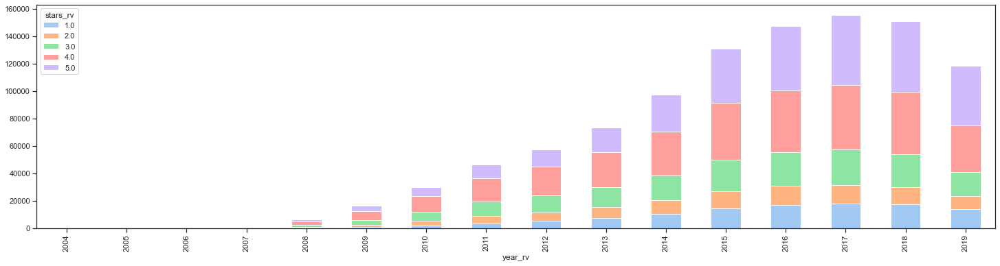

In [81]:
rv_df.groupby(['year_rv','stars_rv'])['qtde_rv'].agg('sum').unstack('stars_rv').plot(kind = 'bar', stacked = True, figsize = (25,6))

In [82]:
bf2 = spark.sql('''
                SELECT A.*,
                B.categories,
                B.latitude,
                B.longitude,
                B.name,
                B.review_count,
                B.stars,
                B.AcceptsInsurance,
                B.AgesAllowed,
                B.Alcohol,
                B.BYOB,
                B.BikeParking,
                B.BusinessAcceptsCreditCards,
                B.ByAppointmentOnly,
                B.Caters,
                B.CoatCheck,
                B.Corkage,
                B.DogsAllowed,
                B.DriveThru,
                B.GoodForDancing,
                B.GoodForKids,
                B.HappyHour,
                B.HasTV,
                B.NoiseLevel,
                B.OutdoorSeating,
                B.RestaurantsAttire,
                B.RestaurantsDelivery,
                B.RestaurantsGoodForGroups,
                B.RestaurantsPriceRange2,
                B.RestaurantsReservations,
                B.RestaurantsTableService,
                B.RestaurantsTakeOut,
                B.Smoking,
                B.WheelchairAccessible,
                B.WiFi,
                B.tips_counter_bz,
                B.total_compliments_bz
                
                FROM bf1 as A 
                RIGHT JOIN bz as B
                ON A.business_id = B.business_id
                
                WHERE year_rv >= 2017
                
                ''')

In [83]:
bf2.createOrReplaceTempView('bf2')

In [84]:
spark.sql('''
            SELECT 
            COUNT(DISTINCT business_id)
            FROM bf2
            ''').show()

+---------------------------+
|count(DISTINCT business_id)|
+---------------------------+
|                      13428|
+---------------------------+



In [85]:
bf2.columns

['user_id',
 'average_stars',
 'compliment_cool',
 'compliment_cute',
 'compliment_funny',
 'compliment_hot',
 'compliment_list',
 'compliment_more',
 'compliment_note',
 'compliment_photos',
 'compliment_plain',
 'compliment_profile',
 'compliment_writer',
 'cool',
 'elite_count',
 'fans',
 'friends_count',
 'funny',
 'review_count_usr',
 'useful',
 'year_since',
 'tips_counter',
 'total_compliments',
 'cluster_usr',
 'business_id',
 'stars_rv',
 'year_rv',
 'categories',
 'latitude',
 'longitude',
 'name',
 'review_count',
 'stars',
 'AcceptsInsurance',
 'AgesAllowed',
 'Alcohol',
 'BYOB',
 'BikeParking',
 'BusinessAcceptsCreditCards',
 'ByAppointmentOnly',
 'Caters',
 'CoatCheck',
 'Corkage',
 'DogsAllowed',
 'DriveThru',
 'GoodForDancing',
 'GoodForKids',
 'HappyHour',
 'HasTV',
 'NoiseLevel',
 'OutdoorSeating',
 'RestaurantsAttire',
 'RestaurantsDelivery',
 'RestaurantsGoodForGroups',
 'RestaurantsPriceRange2',
 'RestaurantsReservations',
 'RestaurantsTableService',
 'RestaurantsT

In [86]:
bf2.write \
    .format('csv') \
    .mode('overwrite') \
    .option('sep', ',') \
    .option('header', True) \
    .save('output/yelp.csv')

## Reviews

### Tratamento do texto

In [121]:
#Função para remoção de pontuação e tratamento das palavras
def word_clean(sdf,col,new_col):
    rv1 = sdf.withColumn(new_col,f.regexp_replace(f.col(col), "'d", " would"))
    rv2 = rv1.withColumn(new_col,f.regexp_replace(f.col(new_col), "'ve", " have"))
    rv3 = rv2.withColumn(new_col,f.regexp_replace(f.col(new_col), "'s", " is"))
    rv4 = rv3.withColumn(new_col,f.regexp_replace(f.col(new_col), "'re", " are"))
    rv5 = rv4.withColumn(new_col,f.regexp_replace(f.col(new_col), "n't", " not"))
    rv6 = rv5.withColumn(new_col,f.regexp_replace(f.col(new_col), '\W+', " "))
    rv7 = rv6.withColumn(new_col,f.lower(f.col(new_col)))
    return rv7

In [122]:
rv_raw.columns

['business_id',
 'cool',
 'date',
 'funny',
 'review_id',
 'stars',
 'text',
 'useful',
 'user_id']

In [123]:
usr_clusters2.createOrReplaceTempView('usr_clusters2')
rv_raw.createOrReplaceTempView('rv_raw')

In [124]:
spark.sql('''
                SELECT 
                count(*)
           
                FROM rv_raw 
                
                ''').show()

+--------+
|count(1)|
+--------+
| 8021122|
+--------+



In [125]:
words = spark.sql('''
                SELECT
                A.review_id,
                A.business_id,
                A.user_id,
                A.text,                
                max(B.text) as text_tp
           
                FROM rv_raw as A
                
                LEFT JOIN tp as B
                ON A.user_id = B.user_id and A.business_id = B.business_id
                
                GROUP BY 1, 2, 3, 4
                
                ''')

In [126]:
words.createOrReplaceTempView('words')

In [127]:
spark.sql('''
                SELECT 
                count(*)
           
                FROM words
                
                ''').show()

+--------+
|count(1)|
+--------+
| 8021122|
+--------+



In [128]:
bz.columns

['address',
 'business_id',
 'categories',
 'city',
 'is_open',
 'latitude',
 'longitude',
 'name',
 'postal_code',
 'review_count',
 'stars',
 'state',
 'Friday',
 'Monday',
 'Saturday',
 'Sunday',
 'Thursday',
 'Tuesday',
 'Wednesday',
 'AcceptsInsurance',
 'AgesAllowed',
 'Alcohol',
 'Ambience',
 'BYOB',
 'BYOBCorkage',
 'BestNights',
 'BikeParking',
 'BusinessAcceptsBitcoin',
 'BusinessAcceptsCreditCards',
 'BusinessParking',
 'ByAppointmentOnly',
 'Caters',
 'CoatCheck',
 'Corkage',
 'DietaryRestrictions',
 'DogsAllowed',
 'DriveThru',
 'GoodForDancing',
 'GoodForKids',
 'GoodForMeal',
 'HairSpecializesIn',
 'HappyHour',
 'HasTV',
 'Music',
 'NoiseLevel',
 'Open24Hours',
 'OutdoorSeating',
 'RestaurantsAttire',
 'RestaurantsCounterService',
 'RestaurantsDelivery',
 'RestaurantsGoodForGroups',
 'RestaurantsPriceRange2',
 'RestaurantsReservations',
 'RestaurantsTableService',
 'RestaurantsTakeOut',
 'Smoking',
 'WheelchairAccessible',
 'WiFi']

In [129]:
words2 = spark.sql('''
                SELECT A.*
                
                FROM bz22 as B
                LEFT JOIN words as A

                ON A.business_id = B.business_id
                                
                ''')

In [130]:
words2.count()

481658

In [131]:
words2.createOrReplaceTempView('words2')

In [132]:
words3 = spark.sql('''
                SELECT A.*,
                B.cluster_usr
                
                FROM words2 as A
                LEFT JOIN usr_clusters2 as B

                ON A.user_id = B.user_id
                                
                ''')

In [133]:
words3.count()

481658

In [134]:
words4 = word_clean(words3,'text','text_clean')
words5 = word_clean(words4,'text_tp','text_clean_tp')

In [135]:
words5.show(4)

+--------------------+--------------------+--------------------+--------------------+-------+-----------+--------------------+-------------+
|           review_id|         business_id|             user_id|                text|text_tp|cluster_usr|          text_clean|text_clean_tp|
+--------------------+--------------------+--------------------+--------------------+-------+-----------+--------------------+-------------+
|QfGRzYeTGwZReGXO7...|478TIlfHXfT3wvww5...|-4Anvj46CWf57KWI9...|My friend and I s...|   null|         14|my friend and i s...|         null|
|SwFpvyHau8KSyHAfC...|MlKNIbEM-JL9WesSd...|-BUamlG3H-7yqpAl1...|Horrible customer...|   null|         11|horrible customer...|         null|
|bssWq2Anohi5HtuXR...|Ze4VPogvcD7inc3Qu...|-CGdueQKCHM_KnHxO...|Horrible service....|   null|         10|horrible service ...|         null|
|uYdh1LRp0CSuT5EJW...|djKTruHtS4n_vlfOk...|-JBB4-ALR07J6Pbx4...|This place has a ...|   null|          6|this place has a ...|         null|
+------------

In [136]:
from pyspark.sql.functions import split, regexp_replace, col, split, stddev, regexp_replace

words6 = words5.select("cluster_usr", split("text_clean", r"[\s.]+").alias("text2"), split("text_clean_tp", r"[\s.]+").alias("text_tp2"))


In [137]:
from pyspark.ml.feature import StopWordsRemover

remover = StopWordsRemover(inputCol="text2", outputCol="text_filtered")

words7 = remover.transform(words6)

words7.show(5)

IllegalArgumentException: 'StopWordsRemover_b7c38e73747d parameter locale given invalid value en_BR.'

In [ ]:
from pyspark.sql.functions import concat_ws

words8 = words7.select("cluster_usr", "text_filtered", 
                 concat_ws(' ',  "text_filtered").alias("text_filtered2")) 

In [ ]:
words9 = words8.withColumn('wordCount', f.size(f.split(f.col('text_filtered2'),' ')))

In [ ]:
words10 = words9.withColumn('word', f.explode(f.split(f.col('text_filtered2'), ' ')))\
            .groupBy('word','cluster_usr')\
            .count()\
            .sort('count', ascending = False)
words10.show()

In [ ]:
words10.createOrReplaceTempView('words10')

In [ ]:
cls = []
for i in range(1,11):
    cls.append(spark.sql(f'''  SELECT word, count FROM words10 WHERE word IS NOT NULL and cluster_usr == {i} ORDER BY count DESC LIMIT 50'''))
#     cls[i-1].toPandas()
#     cls[i-1] = [tuple(x) for  x in cls[i-1].to_numpy()]
cls[-1].toPandas().to_numpy()

In [ ]:
tx1 = cl1.toPandas()
tupla1 = [tuple(x) for  x in text.to_numpy()]
tx2 = cl2.toPandas()
tupla2 = [tuple(x) for  x in text.to_numpy()]
tx3 = cl3.toPandas()
tupla3 = [tuple(x) for  x in text.to_numpy()]
tx4 = cl4.toPandas()
tupla4 = [tuple(x) for  x in text.to_numpy()]
tx5 = cl5.toPandas()
tupla5 = [tuple(x) for  x in text.to_numpy()]
tx6 = c61.toPandas()
tupla6 = [tuple(x) for  x in text.to_numpy()]
tx7 = cl7.toPandas()
tupla7 = [tuple(x) for  x in text.to_numpy()]
tx8 = cl8.toPandas()
tupla8 = [tuple(x) for  x in text.to_numpy()]
tx9 = cl9.toPandas()
tupla9 = [tuple(x) for  x in text.to_numpy()]
tx10 = cl10.toPandas()
tupla10 = [tuple(x) for  x in text.to_numpy()]

In [ ]:
import wordcloud as wc
import matplotlib.pyplot as plt

def nuvem(texto):
    wordcloud = wc.WordCloud(max_font_size=20, 
                         max_words=40, 
                         background_color="white").generate(texto)
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.axis("off")
    plt.show()

In [ ]:
wordcloud1 = WordCloud().generate(str(tupla1).replace("'",""))



In [ ]:
plt.figure(figsize=(10, 10))
plt.imshow(wordcloud1, interpolation = 'bilinear')
plt.axis('off')
plt.show()

# Análise Gráfica

## Heatmap

- Criando mapa de calor da concentração de reviews

In [286]:
base_mapas = spark.sql('''
                SELECT A.*, B.latitude, B.longitude
                
                FROM bz22 as B
                LEFT JOIN words as A

                ON A.business_id = B.business_id
                                
                ''')

In [287]:
base_mapas.columns

['review_id',
 'business_id',
 'user_id',
 'text',
 'text_tp',
 'latitude',
 'longitude']

In [288]:
base_mapas.createOrReplaceTempView('base_mapas')

In [289]:
mapa1 = spark.sql("""
        SELECT latitude,
        longitude
        
        FROM base_mapas
        
        WHERE latitude is not null
        AND longitude is not null
        
        """)

Decobrindo o ponto central de Latitude e Longetude do Mapa

In [292]:
spark.sql("""
         SELECT avg(latitude) as avg_lat,
         avg(longitude) as avg_long
       
         FROM base_mapas
       
         """).show()

+-----------------+------------------+
|          avg_lat|          avg_long|
+-----------------+------------------+
|43.67367342472855|-79.39164235047365|
+-----------------+------------------+



In [333]:
import folium
from folium import plugins

mapa = folium.Map(location=[43.673, -79.391], 
                  zoom_start=11,
                  tiles='Stamen Toner')
# OpenStreetMap, Stamen Terrain, Stamen Toner

In [334]:
mapa

lat = mapa1.toPandas()['latitude'].values
lon = mapa1.toPandas()['longitude'].values

In [335]:
coordenadas = []
for la, lo in zip(lat, lon):
    coordenadas.append([la,lo])
mapa.add_child(plugins.HeatMap(coordenadas))